### Задание

1) Модифицируйте код и реализуйте [Wasserstein GAN](https://arxiv.org/abs/1701.07875) ([From GAN to WGAN
](https://lilianweng.github.io/posts/2017-08-20-gan/)) используя weight clipping. (1 балл)

2) Замените  weight clipping на [gradient penalty](https://arxiv.org/pdf/1704.00028v3.pdf). (1 балл)

3) Добавьте к обучению WGAN условие на метку, продемонстрируйте [условную генерацию](https://arxiv.org/pdf/1411.1784.pdf).  (1 балл) 

Напишите отчет о том, что попробовали, какие результаты получили, какую архитектуру использовали, как вам кажется надо обучать GAN, чтобы добиться сходимости? Каждый пункт обязательно сопроводите визуализациями.

In [18]:
from __future__ import print_function
import argparse
import os
import pickle
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils


import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

## Inputs

Let’s define some inputs for the run:

-  **dataroot** - the path to the root of the dataset folder. We will
   talk more about the dataset in the next section
-  **workers** - the number of worker threads for loading the data with
   the DataLoader
-  **batch_size** - the batch size used in training. The DCGAN paper
   uses a batch size of 128
-  **image_size** - the spatial size of the images used for training.
   This implementation defaults to 64x64. If another size is desired,
   the structures of D and G must be changed. See
   [here](https://github.com/pytorch/examples/issues/70)_ for more
   details
-  **nc** - number of color channels in the input images. For color
   images this is 3
-  **nz** - length of latent vector
-  **ngf** - relates to the depth of feature maps carried through the
   generator
-  **ndf** - sets the depth of feature maps propagated through the
   discriminator
-  **num_epochs** - number of training epochs to run. Training for
   longer will probably lead to better results but will also take much
   longer
-  **lr** - learning rate for training. As described in the DCGAN paper,
   this number should be 0.0002
-  **beta1** - beta1 hyperparameter for Adam optimizers. As described in
   paper, this number should be 0.5
-  **ngpu** - number of GPUs available. If this is 0, code will run in
   CPU mode. If this number is greater than 0 it will run on that number
   of GPUs


In [2]:
from dataclasses import dataclass

@dataclass
class Config:
    # Root directory for dataset
    dataroot = "/kaggle/input/hw11-generator-descriminator/"

    # Number of workers for dataloader
    workers = 2

    # Batch size during training
    batch_size = 128

    # Spatial size of training images. All images will be resized to this
    #   size using a transformer.
    image_size = 64

    # Number of channels in the training images. For color images this is 3
    nc = 3

    # Size of z latent vector (i.e. size of generator input)
    nz = 100

    # Size of feature maps in generator
    ngf = 64

    # Size of feature maps in discriminator
    ndf = 64

    # Number of training epochs
    num_epochs = 1

    # Learning rate for optimizers
    lr = 0.0002

    # Beta1 hyperparam for Adam optimizers
    beta1 = 0.5

    # Number of GPUs available. Use 0 for CPU mode.
    ngpu = 1
    
    # For weight clipping
    clip = 0.01
    
    # For gradient penalty
    lambda_gp = 10.0
    


    # mnist_path = None
    # mnist_path = None
    # num_workers = 3
    # num_epochs = 10
    # noise_size = 50
    # print_freq = 100

config = Config()

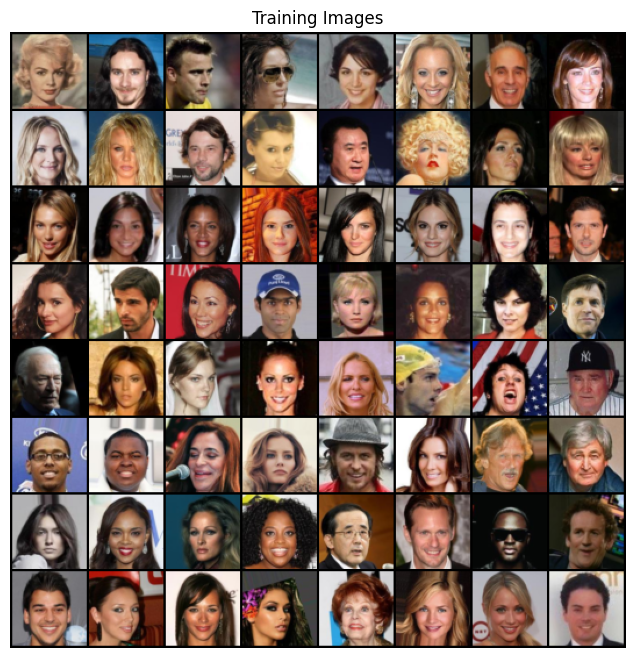

In [4]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=config.dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(config.image_size),
                               transforms.CenterCrop(config.image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=config.batch_size,
                                         shuffle=True, num_workers=config.workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and config.ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [5]:
len(dataloader)

1583

In [6]:
for image, cat in dataloader:
    break

In [7]:
image.size()

torch.Size([128, 3, 64, 64])

## Weight Initialization

From the DCGAN paper, the authors specify that all model weights shall
be randomly initialized from a Normal distribution with mean=0,
stdev=0.02. The ``weights_init`` function takes an initialized model as
input and reinitializes all convolutional, convolutional-transpose, and
batch normalization layers to meet this criteria. This function is
applied to the models immediately after initialization.


In [8]:
# custom weights initialization called on generator and discriminator
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

## Generator

In [10]:
class Generator(nn.Module):
    def __init__(self, ngpu, nz, ngf, nc):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution 512
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
#             nn.InstanceNorm2d(ngf * 8, affine=True),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            
            # state size. (ngf*8) x 4 x 4 256
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
#             nn.InstanceNorm2d(ngf * 4, affine=True),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
#             nn.InstanceNorm2d(ngf * 2, affine=True),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
#             nn.InstanceNorm2d(ngf, affine=True),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [11]:
# Create the generator
generator = Generator(config.ngpu, config.nz, config.ngf, config.nc).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (config.ngpu > 1):
    generator = nn.DataParallel(generator, list(range(config.ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
generator.apply(weights_init)

# Print the model
print(generator)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


## Discriminator

In [12]:
class Discriminator(nn.Module):
    def __init__(self, ngpu, nc, ndf):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ndf * 2),
            nn.InstanceNorm2d(ndf * 2, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ndf * 4),
            nn.InstanceNorm2d(ndf * 4, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ndf * 8),
            nn.InstanceNorm2d(ndf * 8, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
#             nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [13]:
# Create the Discriminator
discriminator = Discriminator(config.ngpu, config.nc, config.ndf).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (config.ngpu > 1):
    discriminator = nn.DataParallel(discriminator, list(range(config.ngpu)))
    
# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
discriminator.apply(weights_init)

# Print the model
print(discriminator)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  )
)


# Loss functions and optimizers

In [14]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, config.nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = -1.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(discriminator.parameters(), lr=config.lr, betas=(config.beta1, 0.999))
optimizerG = optim.Adam(generator.parameters(), lr=config.lr, betas=(config.beta1, 0.999))

# Setup RMSProp optimizers for both G and D
# optimizerD = optim.RMSprop(discriminator.parameters(), lr=config.lr)
# optimizerG = optim.RMSprop(generator.parameters(), lr=config.lr)

## Gradient penalty

In [15]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    bsize, c, h, w = real_samples.shape
    alpha = torch.rand((bsize, 1, 1, 1)).repeat(1, c, h, w).to(device)
    
    interpolates = (alpha * real_samples + ((1 - alpha) * fake_samples))
    d_interpolates = discriminator(interpolates)
    
    gradients = torch.autograd.grad(
        inputs=interpolates,
        outputs=d_interpolates,
        grad_outputs=torch.ones_like(d_interpolates),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradients = gradients.view(gradients.size(0), -1)
    gradient_norm = gradients.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
                                                
    return gradient_penalty


# Training

In [233]:
# Training Loop
from tqdm import tqdm
def train_wgan(generator, discriminator, optimizerG, optimizerD, dataloader, config, is_clipping=True):
    # Lists to keep track of progress
    img_list = []
    G_losses = []
    D_losses = []
    iters = 0
    n_critic = 5

    print("Starting Training Loop...")
    # For each epoch
    for epoch in range(config.num_epochs):
        # For each batch in the dataloader
        for i, data in enumerate(dataloader, 0):
    #     for i, data in enumerate(tqdm(dataloader, desc=f'Epoch {epoch}/{config.num_epochs}', unit='batch', leave=False), 0):
            ############################
            # (1) Update D network: maximize WGAN objective
            ###########################
            for _ in range(n_critic):
                discriminator.zero_grad()

                # real
                # Format batch
                real_cpu = data[0].to(device)
                b_size = real_cpu.size(0)
                output_real = discriminator(real_cpu).view(-1)
                errD_real = torch.mean(output_real)

                ## fake
                noise = torch.randn(b_size, config.nz, 1, 1, device=device)
                fake = generator(noise)
                output_fake = discriminator(fake.detach()).view(-1)
                errD_fake = torch.mean(output_fake)

                # Compute WGAN loss
                errD = errD_fake - errD_real
                
                if is_clipping:
                    # Clip weights
                    for param in discriminator.parameters():
                        param.data.clamp_(-config.clip, config.clip)
                else:
                    # Compute gradient penalty
                    gp = gradient_penalty(discriminator, real_cpu, fake)
                    errD += config.lambda_gp * gp  # Add the gradient penalty term
                
                errD.backward(retain_graph=True)
                
                D_x = output_real.mean().item()
                D_G_z1 = output_fake.mean().item()

                optimizerD.step()

            ############################
            # (2) Update G network: min -E(D(G(z)))
            ###########################
            generator.zero_grad()
            label.fill_(real_label)  # fake labels are real for generator cost
#             label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
            output = discriminator(fake).view(-1)
            errG = -torch.mean(output) # use instead of criterion
            errG.backward()
            D_G_z2 = output.mean().item()

            optimizerG.step()

            # Output training stats
            if i % 50 == 0:
                tqdm.write('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                           % (epoch, config.num_epochs, i, len(dataloader),
                              errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))


            # Save Losses for plotting later
            G_losses.append(errG.item())
            D_losses.append(errD.item())

            # Check how the generator is doing by saving G's output on fixed_noise
            if (iters % 500 == 0) or ((epoch == config.num_epochs-1) and (i == len(dataloader)-1)):
                with torch.no_grad():
                    fake = generator(fixed_noise).detach().cpu()
                img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

            iters += 1
    return img_list, G_losses, D_losses

In [ ]:
# WCGAN с Adam && InstanceNorm only in descriminator (affine=False) && gradient_penalty
img_list, G_losses, D_losses = train_wgan(generator, discriminator, optimizerG, optimizerD, dataloader, config, is_clipping=False)

In [ ]:
# WCGAN с Adam && InstanceNorm in both (gen & disc with affine=True) && gradient_penalty
img_list, G_losses, D_losses = train_wgan(generator, discriminator, optimizerG, optimizerD, dataloader, config, is_clipping=False)

In [ ]:
# WCGAN с Adam && InstanceNorm in disc && BatchNorm in gen (affine=True) && gradient_penalty
img_list, G_losses, D_losses = train_wgan(generator, discriminator, optimizerG, optimizerD, dataloader, config, is_clipping=False)

# Visualization

In [ ]:
# WCGAN с Adam && InstanceNorm in both (gen & disc with affine=True) && gradient_penalty
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

## Визуализация WCGAN результатов с Adam && InstanceNorm in disc (affine=True) && BatchNorm in gen && gradient_penalty

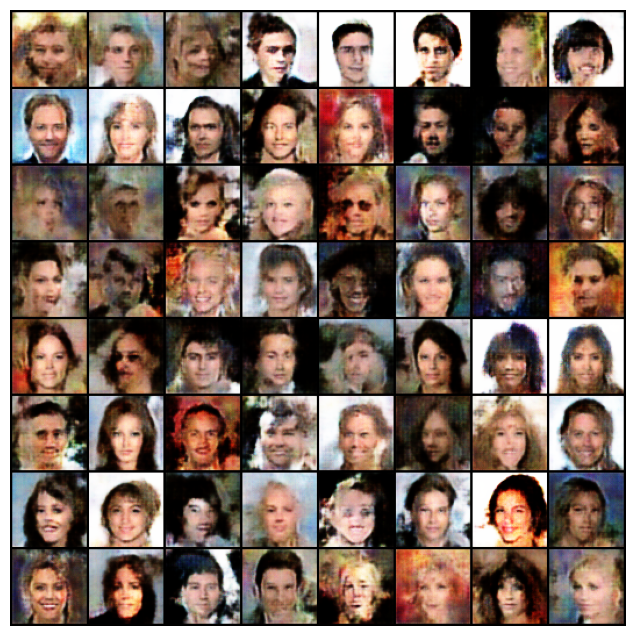

In [278]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

# Визуализация последней полученной модели более подробно

In [ ]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

# Latent sparse arithmetics

In [307]:
# Utility function to plot results
def tensor_to_image(tensor):
    if len(tensor.shape) == 4:
        tensor = tensor[0]
    tensor = ((tensor + 1) / 2).clamp(0, 1)
    return transforms.ToPILImage()((255 * tensor.cpu().detach()).to(torch.uint8))

In [ ]:
with torch.no_grad():
    z = torch.randn([2, config.nz,1,1]).to(device)
    initial_images = generator(z)

    z = torch.stack([с * z[1] + (1 - с) * z[0] for с in torch.arange(0, 1.00, 0.125)])
    interp_images = generator(z)
    
_, axs = plt.subplots(2, 1, dpi=200)
for ax in axs: ax.axis('off')

axs[0].imshow(tensor_to_image(vutils.make_grid(initial_images, nrow=6)))
axs[1].imshow(tensor_to_image(vutils.make_grid(interp_images, nrow=len(z))))

# Выводы
## Все рассматривал в рамке одной эпохи
- Был выбран датасет celeba, потому что я захотел генерировать картинки людей, а не fashion_mnist.
- Выбрал архитектуру сети, предложенную в статье про WGAN (см. начало ноутбука).

### Что я понял:
1. Для алгоритма WGAN с weight clipping лучше подойдет RMSprop оптимизатор (а не Adam) и BatchNorm2d.
2. Для алгоритма WGAN с gradient penalty лучше подойдет Adam оптимизатор (не RMSprop) и InstanceNorm2d (с affine=True, или LayerNorm2d).
3. Gradient penalty показывает очень хорошо сходящуюся ошибку. Возможно это была какая-то случайность, но я наблюдал куда большую стабильность в схождении. Точно связана с тем, что мы не стали просто обрезать градиенты.
4. Результаты визуализаций продемонстрировал. (Игрался с параметрами гораздо больше, чем показал, но некоторые затирал, иначе слишком объемно бы вышло).

### Что на мой взгляд лучше работает и хуже
1. Результаты с gradient_penalty + Adam + InstanceNorm2d(affine=True) получились лучше всего, но обучались дольше.
2. Убирая BatchNorm с weigth clipping перестает вообще генерировать хорошие результаты.

# Условная генерация

### Увы, я не нашел разметку атрибутов для celeby, поэтому будем юзать fashion mnist

In [22]:
import torchvision
fm_dataset = torchvision.datasets.FashionMNIST("fashion_mnist", train=True, transform=torchvision.transforms.ToTensor(), download=True)
fm_dataloader = torch.utils.data.DataLoader(fm_dataset, batch_size=config.batch_size,
                                         shuffle=True, num_workers=config.workers)

100%|██████████| 26421880/26421880 [00:01<00:00, 18638698.71it/s]


Extracting fashion_mnist/FashionMNIST/raw/train-images-idx3-ubyte.gz to fashion_mnist/FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 301585.66it/s]


Extracting fashion_mnist/FashionMNIST/raw/train-labels-idx1-ubyte.gz to fashion_mnist/FashionMNIST/raw



100%|██████████| 4422102/4422102 [00:00<00:00, 5521725.05it/s]


Extracting fashion_mnist/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to fashion_mnist/FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 10233306.63it/s]

Extracting fashion_mnist/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to fashion_mnist/FashionMNIST/raw



In [94]:
selected_classes = [i for i in range(10)]  # Trouser и Ankle Boot
selected_indices = []
config.num_classes = 10
config.img_size = 28
config.nc = 1

for i, (img, label) in enumerate(fm_dataset):
    if label in selected_classes:
        selected_indices.append(i)

In [95]:
subset_dataset = torch.utils.data.Subset(fm_dataset, selected_indices)
dataloader_conditional = torch.utils.data.DataLoader(subset_dataset, batch_size=config.batch_size, shuffle=True, num_workers=2)

# Проверяем размер батча
for batch in dataloader_conditional:
    print("Batch size:", batch[0].size())
    break

Batch size: torch.Size([128, 1, 28, 28])


In [96]:
dataiter = iter(dataloader_conditional)

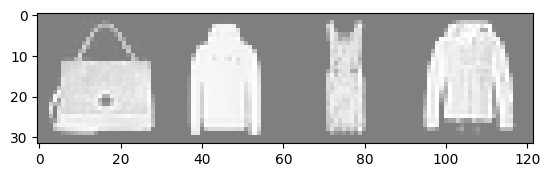

Ground Truth Labels: [8 2 3 4]


In [97]:
def imshow(img):
    img = img / 2 + 0.5  # Денормализация
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

# Выбираем несколько случайных изображений из датасета
images, labels = next(dataiter)

# Отображаем изображения
imshow(vutils.make_grid(images[:4], padding=2, normalize=True))
print("Ground Truth Labels:", labels[:4].numpy())

In [98]:
def gradient_penalty_conditional(discriminator, real_labels, real_samples, fake_samples):
    bsize, c, h, w = real_samples.shape
    alpha = torch.rand((bsize, 1, 1, 1)).repeat(1, c, h, w).to(device)

    interpolates = (alpha * real_samples + ((1 - alpha) * fake_samples))
    d_interpolates = discriminator(interpolates, real_labels)

    gradients = torch.autograd.grad(
        inputs=interpolates,
        outputs=d_interpolates,
        grad_outputs=torch.ones_like(d_interpolates),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradients = gradients.view(gradients.size(0), -1)
    gradient_norm = gradients.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)

    return gradient_penalty


In [223]:
# Модифицированный генератор
class GeneratorConditional(nn.Module):
    def __init__(self, ngpu, nz, ngf, nc, num_classes, img_size, embed_size):
        super(GeneratorConditional, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            
            # input is Z, going into a convolution 256
            nn.ConvTranspose2d(nz + embed_size, ngf * 4, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            
            # state size. (ngf*4) x 4 x 4
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            
            # state size. (ngf*2) x 8 x 8
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            
            # state size. (ngf) x 16 x 16
            nn.ConvTranspose2d(ngf, nc, 4, 2, 3, bias=False),
            nn.Tanh()
            # state size. (nc) x 28 x 28
        )
        self.img_size = img_size
        self.embed = nn.Embedding(num_classes, embed_size)

    def forward(self, input, labels):
        # N * noise_dim * 1 * 1
        embedding = self.embed(labels).unsqueeze(2).unsqueeze(3)
        concatenated = torch.cat([input, embedding], dim=1)
        return self.main(concatenated)

# Модифицированный дискриминатор
class DiscriminatorConditional(nn.Module):
    def __init__(self, ngpu, nc, ndf, num_classes, img_size):
        super(DiscriminatorConditional, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 28 x 28
#             nn.Conv2d(nc + 1, ndf, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Conv2d(nc + 1, ndf, kernel_size=4, stride=1, padding=0, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (ndf) x 14 x 14
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(ndf * 2, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (ndf*2) x 7 x 7
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(ndf * 4, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (ndf*4) x 4 x 4
            nn.Conv2d(ndf * 4, 1, 4, 1, 0, bias=False),
        )
        
        self.img_size = img_size
        self.embed = nn.Embedding(num_classes, img_size * img_size)

    
    def forward(self, input, labels):
        embedding = self.embed(labels).view(labels.shape[0], 1, self.img_size, self.img_size)
        concatenated = torch.cat([input, embedding], dim=1) # Batch_size * C * H * W
        return self.main(concatenated)

In [156]:
config.ndf

64

In [301]:
def train_wgan_conditional(generator, discriminator, optimizerG, optimizerD, dataloader, config):
    img_list = []
    G_losses = []
    D_losses = []
    iters = 0
    n_critic = 5

    print("Starting Training Loop...")
    for epoch in range(config.num_epochs):
        for i, (images, cat) in enumerate(dataloader, 0):
            ############################
            # (1) Update D network
            ###########################
            for _ in range(n_critic):
                discriminator.zero_grad()
                
                # real
                real_cpu, real_labels = images.to(device), cat.to(device)
                b_size = real_cpu.size(0)
                output_real = discriminator(real_cpu, real_labels).view(-1)
                errD_real = torch.mean(output_real)

                # fake
                noise = torch.randn(b_size, config.nz, 1, 1, device=device)
#                 fake_labels = torch.randint(0, config.num_classes, (b_size,), device=device)
                fake = generator(noise, real_labels)
                output_fake = discriminator(fake.detach(), real_labels).view(-1)
                errD_fake = torch.mean(output_fake)

                errD = errD_fake - errD_real
                gp = gradient_penalty_conditional(discriminator, real_labels, real_cpu, fake)
                errD += config.lambda_gp * gp

                errD.backward(retain_graph=True)
                D_x = output_real.mean().item()
                D_G_z1 = output_fake.mean().item()
                optimizerD.step()

            ############################
            # (2) Update G network
            ###########################
            generator.zero_grad()
            fake_labels = torch.randint(0, config.num_classes, (b_size,), device=device)
            fake = generator(noise, fake_labels)
            output = discriminator(fake, fake_labels).view(-1)
            errG = -torch.mean(output)
            errG.backward()
            optimizerG.step()
            
            D_G_z2 = output.mean().item()
            
            # Output training stats
            if i % 50 == 0:
                tqdm.write('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                           % (epoch, config.num_epochs, i, len(dataloader),
                              errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))


            # Save Losses for plotting later
            G_losses.append(errG.item())
            D_losses.append(errD.item())

            # Check how the generator is doing by saving G's output on fixed_noise
            if (iters % 500 == 0) or ((epoch == config.num_epochs-1) and (i == len(dataloader)-1)):
                with torch.no_grad():
                    fake = generator(fixed_noise, fixed_labels).detach().cpu()
                img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

            iters += 1
    return img_list, G_losses, D_losses

In [280]:
generator_cond = GeneratorConditional(config.ngpu, config.nz, config.ngf, config.nc, config.num_classes, config.img_size, embed_size=200).to(device)
discriminator_cond = DiscriminatorConditional(config.ngpu, config.nc, config.ndf, config.num_classes, config.img_size).to(device)

fixed_noise = torch.randn(config.batch_size, config.nz, 1, 1, device=device)
fixed_labels = torch.randint(0, config.num_classes, (fixed_noise.size(0),), device=device)

# device = 'cpu'

device = torch.device("cuda:0" if (torch.cuda.is_available() and config.ngpu > 0) else "cpu")

if (device.type == 'cuda') and (config.ngpu > 1):
    generator_cond = nn.DataParallel(generator_cond, list(range(config.ngpu)))
    discriminator_cond = nn.DataParallel(discriminator_cond, list(range(config.ngpu)))


generator_cond.apply(weights_init)
discriminator_cond.apply(weights_init)

optimizerD_cond = optim.Adam(discriminator_cond.parameters(), lr=config.lr, betas=(config.beta1, 0.999))
optimizerG_cond = optim.Adam(generator_cond.parameters(), lr=config.lr, betas=(config.beta1, 0.999))

In [289]:
config.num_epochs = 3

In [292]:
# 3 epochs
img_list, G_losses, D_losses = train_wgan_conditional(generator_cond, discriminator_cond, optimizerG_cond, optimizerD_cond, dataloader_conditional, config)

Starting Training Loop...
[0/3][0/469]	Loss_D: -0.1054	Loss_G: -1.6294	D(x): 1.7516	D(G(z)): 1.6433 / 1.6294
[0/3][50/469]	Loss_D: 0.0279	Loss_G: -1.9962	D(x): 2.0001	D(G(z)): 2.0248 / 1.9962
[0/3][100/469]	Loss_D: -0.1494	Loss_G: -1.9122	D(x): 2.0871	D(G(z)): 1.9299 / 1.9122
[0/3][150/469]	Loss_D: -0.0823	Loss_G: -1.7831	D(x): 1.8581	D(G(z)): 1.7657 / 1.7831
[0/3][200/469]	Loss_D: -0.1042	Loss_G: -2.1209	D(x): 2.2697	D(G(z)): 2.1563 / 2.1209
[0/3][250/469]	Loss_D: -0.1038	Loss_G: -2.4931	D(x): 2.6109	D(G(z)): 2.4930 / 2.4931
[0/3][300/469]	Loss_D: -0.1354	Loss_G: -2.3802	D(x): 2.5512	D(G(z)): 2.3949 / 2.3802
[0/3][350/469]	Loss_D: -0.1493	Loss_G: -2.0806	D(x): 2.2523	D(G(z)): 2.0863 / 2.0806
[0/3][400/469]	Loss_D: -0.0570	Loss_G: -2.0550	D(x): 2.1122	D(G(z)): 2.0519 / 2.0550
[0/3][450/469]	Loss_D: -0.1040	Loss_G: -2.3418	D(x): 2.4755	D(G(z)): 2.3677 / 2.3418
[1/3][0/469]	Loss_D: -0.0871	Loss_G: -2.2706	D(x): 2.3539	D(G(z)): 2.2627 / 2.2706
[1/3][50/469]	Loss_D: -0.0838	Loss_G: -2.2429

In [302]:
# 3 epochs
img_list, G_losses, D_losses = train_wgan_conditional(generator_cond, discriminator_cond, optimizerG_cond, optimizerD_cond, dataloader_conditional, config)

Starting Training Loop...
[0/3][0/469]	Loss_D: -0.1190	Loss_G: -3.9382	D(x): 4.0405	D(G(z)): 3.9138 / 3.9382
[0/3][50/469]	Loss_D: -0.1079	Loss_G: -4.1378	D(x): 4.2716	D(G(z)): 4.1526 / 4.1378
[0/3][100/469]	Loss_D: -0.1308	Loss_G: -4.0996	D(x): 4.2674	D(G(z)): 4.1210 / 4.0996
[0/3][150/469]	Loss_D: -0.0796	Loss_G: -3.5449	D(x): 3.6479	D(G(z)): 3.5637 / 3.5449
[0/3][200/469]	Loss_D: -0.0755	Loss_G: -4.2930	D(x): 4.4021	D(G(z)): 4.3189 / 4.2930
[0/3][250/469]	Loss_D: -0.1022	Loss_G: -4.1062	D(x): 4.2829	D(G(z)): 4.1691 / 4.1062
[0/3][300/469]	Loss_D: -0.1188	Loss_G: -4.4400	D(x): 4.5911	D(G(z)): 4.4585 / 4.4400
[0/3][350/469]	Loss_D: -0.1186	Loss_G: -4.2488	D(x): 4.4060	D(G(z)): 4.2705 / 4.2488
[0/3][400/469]	Loss_D: -0.1280	Loss_G: -4.0834	D(x): 4.2342	D(G(z)): 4.0789 / 4.0834
[0/3][450/469]	Loss_D: -0.1371	Loss_G: -3.8921	D(x): 4.0932	D(G(z)): 3.9381 / 3.8921
[1/3][0/469]	Loss_D: 0.0439	Loss_G: -3.8070	D(x): 3.9262	D(G(z)): 3.8113 / 3.8070
[1/3][50/469]	Loss_D: -0.1604	Loss_G: -3.5647

Ground Truth Labels: [2 4 5 3 0 6 8 1 4 4 1 0 5 9 5 1]


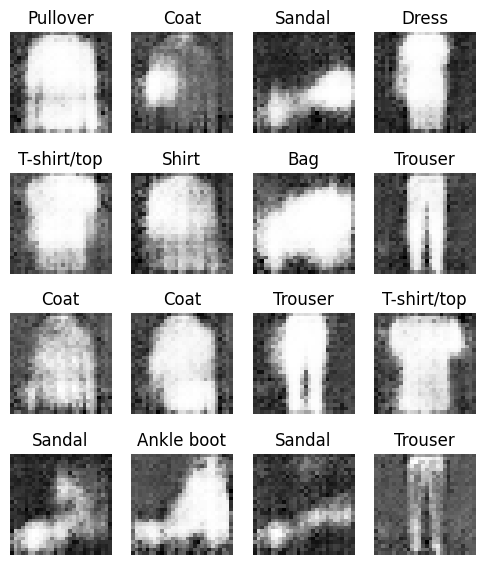

In [284]:
# Задаем имена классов для fashion_mnist
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

gen_labels = config.num_classes

noise = torch.randn(16, config.nz, 1, 1, device=device)
fake_labels = torch.randint(0, gen_labels, (16,), device=device)
fake = generator_cond(noise, fake_labels)

plt.figure(figsize=(6, 7))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.imshow(fake[i].detach().cpu().numpy().reshape(28, 28), cmap=plt.cm.Greys_r)
    
    # Получаем имя класса по метке
    class_name = class_names[fake_labels[i].item()]
    
    plt.title(f'{class_name}')
    plt.axis('off')

print("Ground Truth Labels:", fake_labels.cpu().numpy())


## After 3 epochs

Ground Truth Labels: [9 2 7 0 7 3 6 7 9 0 5 8 9 2 5 7]


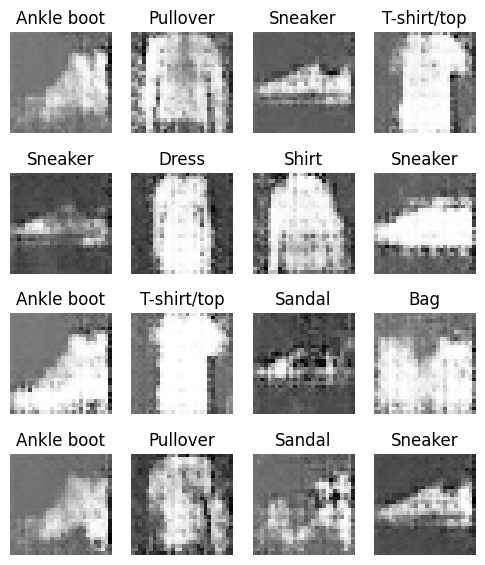

In [295]:
fake = generator_cond(noise, fake_labels)

plt.figure(figsize=(6, 7))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.imshow(fake[i].detach().cpu().numpy().reshape(28, 28), cmap=plt.cm.Greys_r)
    
    # Получаем имя класса по метке
    class_name = class_names[fake_labels[i].item()]
    
    plt.title(f'{class_name}')
    plt.axis('off')

# imshow(vutils.make_grid(images[:4], padding=2, normalize=True))
print("Ground Truth Labels:", fake_labels.cpu().numpy())


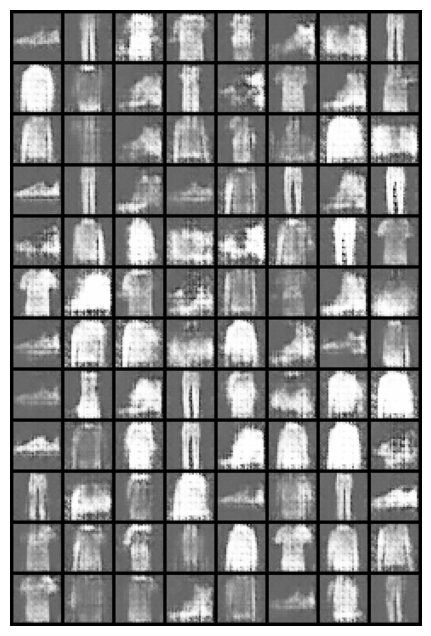

In [296]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

# After 6 epochs

Ground Truth Labels: [1 9 2 4 4 7 6 3 0 8 5 4 0 8 7 3]


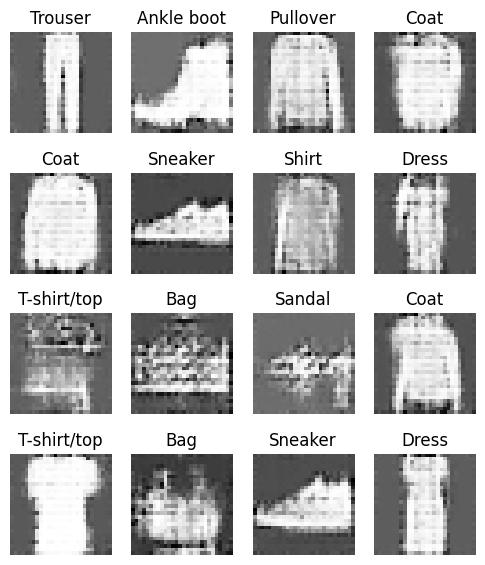

In [313]:
fake = generator_cond(noise, fake_labels)

plt.figure(figsize=(6, 7))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.imshow(fake[i].detach().cpu().numpy().reshape(28, 28), cmap=plt.cm.Greys_r)
    
    # Получаем имя класса по метке
    class_name = class_names[fake_labels[i].item()]
    
    plt.title(f'{class_name}')
    plt.axis('off')

# imshow(vutils.make_grid(images[:4], padding=2, normalize=True))
print("Ground Truth Labels:", fake_labels.cpu().numpy())


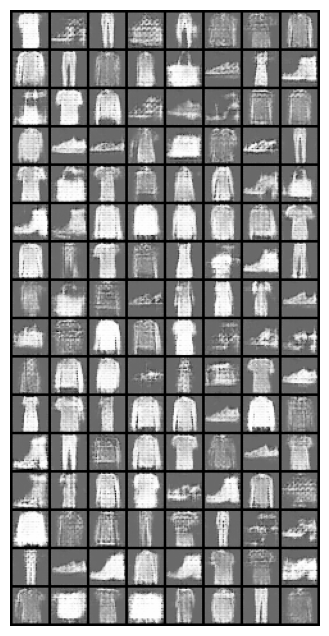

In [303]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

## Как видно, с увеличением числа эпох увеличивается точность генератора. Дальше надо тестить разные архитектуры, запускать на большее число итераций. 

### В целом я доволен предсказанием, а главное тем, что понял, как его реализовать.

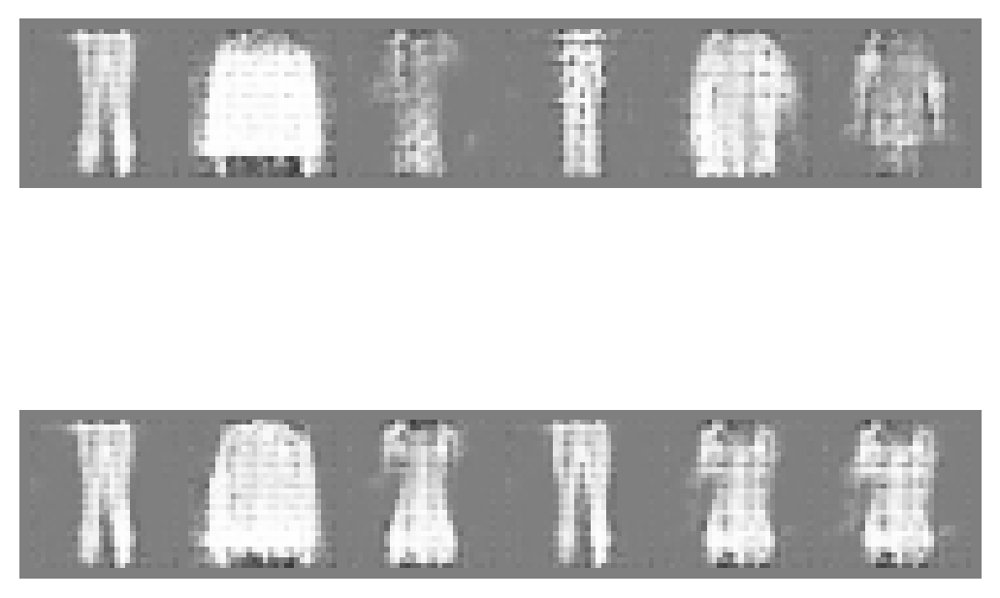

In [331]:
gen_labels = 5
with torch.no_grad():
    fake_labels = torch.randint(0, gen_labels, (8,), device=device)
    noise = torch.randn(8, config.nz, 1, 1, device=device)
    initial_images = generator_cond(noise, fake_labels)
    
    noise = torch.stack([с * noise[1] + (1 - с) * noise[0] for с in torch.arange(0, 1.00, 0.125)])
    interp_images = generator_cond(noise, fake_labels)
    
_, axs = plt.subplots(2, 1, dpi=200)
for ax in axs: ax.axis('off')

axs[0].imshow(tensor_to_image(vutils.make_grid(initial_images[:6], nrow=6)))
axs[1].imshow(tensor_to_image(vutils.make_grid(interp_images[:6], nrow=len(noise))))